In [62]:
#ignore Warning
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set Options for display
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 100
pd.options.display.float_format = '{:.4f}'.format
sns.set_style("whitegrid")
sns.set_context("paper")
%matplotlib inline

# LogReg Algorithm
from sklearn.linear_model import LogisticRegression
#Traintest split
from sklearn.model_selection import train_test_split
#min-max scaler
from sklearn.preprocessing import MinMaxScaler

In [3]:
df = pd.read_csv('dataset/insurance_claims.csv')
df

,months_as_customer,age,policy_number,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,250/500,1000,1406.9100,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,250/500,2000,1197.2200,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,100/300,2000,1413.1400,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,250/500,2000,1415.7400,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,500/1000,1000,1583.9100,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,250/500,1000,1351.1000,0,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,250/500,1000,1333.3500,0,MALE,PhD,prof-specialty,board-games,husband,0,-77000,Multi-vehicle Collision,Front Collision,Minor Damage,Police,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,100/300,1000,1137.0300,0,MALE,Associate,tech-support,base-jumping,unmarried,0,0,Multi-vehicle Collision,Front Collision,Total Loss,Police,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,100/300,500,1442.9900,0,FEMALE,PhD,other-service,golf,own-child,0,0,Single Vehicle Collision,Front Collision,Total Loss,Police,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,100/300,500,1315.6800,0,MALE,PhD,priv-house-serv,camping,wife,0,-39300,Single Vehicle Collision,Rear Collision,Total Loss,Other,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N


# Data analysis

In [4]:
df.shape

(1000, 32)

In [5]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000,1000.0000
mean,203.9540,38.9480,546238.6480,1136.0000,1256.4061,1101000.0000,25126.1000,-26793.7000,11.6440,1.8390,0.9920,1.4870,52761.9400,7433.4200,7399.5700,37928.9500,2005.1030
std,115.1132,9.1403,257063.0053,611.8647,244.1674,2297406.5981,27872.1877,28104.0967,6.9514,1.0189,0.8201,1.1113,26401.5332,4880.9519,4824.7262,18886.2529,6.0159
min,0.0000,19.0000,100804.0000,500.0000,433.3300,-1000000.0000,0.0000,-111100.0000,0.0000,1.0000,0.0000,0.0000,100.0000,0.0000,0.0000,70.0000,1995.0000
25%,115.7500,32.0000,335980.2500,500.0000,1089.6075,0.0000,0.0000,-51500.0000,6.0000,1.0000,0.0000,1.0000,41812.5000,4295.0000,4445.0000,30292.5000,2000.0000
50%,199.5000,38.0000,533135.0000,1000.0000,1257.2000,0.0000,0.0000,-23250.0000,12.0000,1.0000,1.0000,1.0000,58055.0000,6775.0000,6750.0000,42100.0000,2005.0000
75%,276.2500,44.0000,759099.7500,2000.0000,1415.6950,0.0000,51025.0000,0.0000,17.0000,3.0000,2.0000,2.0000,70592.5000,11305.0000,10885.0000,50822.5000,2010.0000
max,479.0000,64.0000,999435.0000,2000.0000,2047.5900,10000000.0000,100500.0000,0.0000,23.0000,4.0000,2.0000,3.0000,114920.0000,21450.0000,23670.0000,79560.0000,2015.0000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_sex                  1000 non-null   object 
 8   insured_education_level      1000 non-null   object 
 9   insured_occupation           1000 non-null   object 
 10  insured_hobbies              1000 non-null   object 
 11  insured_relationship         1000 non-null   object 
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

In [7]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model                     0
auto_year 

In [8]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount               int64
injury_claim             

In [9]:
df.insured_sex.value_counts()

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

In [10]:
df.head(10)

,months_as_customer,age,policy_number,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,250/500,1000,1406.9100,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,250/500,2000,1197.2200,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,100/300,2000,1413.1400,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,250/500,2000,1415.7400,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,500/1000,1000,1583.9100,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,250/500,1000,1351.1000,0,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,250/500,1000,1333.3500,0,MALE,PhD,prof-specialty,board-games,husband,0,-77000,Multi-vehicle Collision,Front Collision,Minor Damage,Police,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,100/300,1000,1137.0300,0,MALE,Associate,tech-support,base-jumping,unmarried,0,0,Multi-vehicle Collision,Front Collision,Total Loss,Police,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,100/300,500,1442.9900,0,FEMALE,PhD,other-service,golf,own-child,0,0,Single Vehicle Collision,Front Collision,Total Loss,Police,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,100/300,500,1315.6800,0,MALE,PhD,priv-house-serv,camping,wife,0,-39300,Single Vehicle Collision,Rear Collision,Total Loss,Other,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N


In [11]:
# checking the value counts of every columns to check if it contains a lot of ? or 0, since this may affect the ML model
# we're also doing this to check the balance of a specific data
# for i, col in enumerate(df.columns):
#     print(df[col].value_counts())
#     print('==================')

df.authorities_contacted.value_counts()

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64

In [12]:
df.head()

,months_as_customer,age,policy_number,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,250/500,1000,1406.9100,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,250/500,2000,1197.2200,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,100/300,2000,1413.1400,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,250/500,2000,1415.7400,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,500/1000,1000,1583.9100,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


## analyzing the data if some features might be a hint of the fraud

In [13]:
# via educational level
df.insured_education_level.value_counts()
df[df['fraud_reported'] == 'Y'].insured_education_level.value_counts()

JD             42
MD             38
High School    36
Associate      34
PhD            33
College        32
Masters        32
Name: insured_education_level, dtype: int64

In [14]:
# via severity of the damage
df[df['fraud_reported'] == 'Y'].incident_severity.value_counts()

Major Damage      167
Minor Damage       38
Total Loss         36
Trivial Damage      6
Name: incident_severity, dtype: int64

In [15]:
# executive managerial average salary is $75,116 per year, but they're number one at fraud report (what a greed)
df[df['fraud_reported'] == 'Y'].insured_occupation.value_counts()

exec-managerial      28
craft-repair         22
machine-op-inspct    22
tech-support         22
transport-moving     21
sales                21
prof-specialty       18
armed-forces         17
farming-fishing      16
protective-serv      14
priv-house-serv      12
other-service        12
handlers-cleaners    11
adm-clerical         11
Name: insured_occupation, dtype: int64

In [16]:
df[df['fraud_reported'] == 'Y'].incident_type.value_counts()

Single Vehicle Collision    117
Multi-vehicle Collision     114
Vehicle Theft                 8
Parked Car                    8
Name: incident_type, dtype: int64

In [17]:
df.umbrella_limit.value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

In [18]:
df[df['fraud_reported'] == 'Y'].incident_type.value_counts()

Single Vehicle Collision    117
Multi-vehicle Collision     114
Vehicle Theft                 8
Parked Car                    8
Name: incident_type, dtype: int64

In [19]:
df[df['fraud_reported'] == 'Y'].auto_make.value_counts()

Mercedes      22
Ford          22
Chevrolet     21
Audi          21
Dodge         20
BMW           20
Suburu        19
Volkswagen    19
Saab          18
Nissan        14
Honda         14
Accura        13
Toyota        13
Jeep          11
Name: auto_make, dtype: int64

In [55]:
df.auto_year.value_counts()

1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype: int64

In [57]:
df[df['fraud_reported'] == 'N'].auto_year.value_counts()

1999    45
1995    43
2010    43
2003    42
2005    42
2009    39
2002    39
2006    39
2012    37
2011    36
2015    36
2008    35
1997    34
2013    34
2007    34
2001    33
1998    33
2014    32
2000    31
1996    23
2004    23
Name: auto_year, dtype: int64

### columns to drop, might be because it is not a numerical or it doesn't make sense to be used as a feature 

In [20]:

col_drop = ['policy_number','insured_occupation','insured_education_level','insured_hobbies','auto_model','authorities_contacted']
df = df.drop(col_drop,axis=1)
df

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,250/500,1000,1406.9100,0,MALE,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y
1,228,42,250/500,2000,1197.2200,5000000,MALE,other-relative,0,0,Vehicle Theft,?,Minor Damage,8,1,?,0,0,?,5070,780,780,3510,Mercedes,2007,Y
2,134,29,100/300,2000,1413.1400,5000000,FEMALE,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N
3,256,41,250/500,2000,1415.7400,6000000,FEMALE,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y
4,228,44,500/1000,1000,1583.9100,6000000,MALE,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N
5,256,39,250/500,1000,1351.1000,0,FEMALE,unmarried,0,0,Multi-vehicle Collision,Rear Collision,Major Damage,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,2003,Y
6,137,34,250/500,1000,1333.3500,0,MALE,husband,0,-77000,Multi-vehicle Collision,Front Collision,Minor Damage,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,2012,N
7,165,37,100/300,1000,1137.0300,0,MALE,unmarried,0,0,Multi-vehicle Collision,Front Collision,Total Loss,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,2015,N
8,27,33,100/300,500,1442.9900,0,FEMALE,own-child,0,0,Single Vehicle Collision,Front Collision,Total Loss,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,2012,N
9,212,42,100/300,500,1315.6800,0,MALE,wife,0,-39300,Single Vehicle Collision,Rear Collision,Total Loss,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,1996,N


In [21]:
df.head()

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,250/500,1000,1406.9100,0,MALE,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y
1,228,42,250/500,2000,1197.2200,5000000,MALE,other-relative,0,0,Vehicle Theft,?,Minor Damage,8,1,?,0,0,?,5070,780,780,3510,Mercedes,2007,Y
2,134,29,100/300,2000,1413.1400,5000000,FEMALE,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N
3,256,41,250/500,2000,1415.7400,6000000,FEMALE,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y
4,228,44,500/1000,1000,1583.9100,6000000,MALE,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N


In [22]:
# some null data is labeled as 0 or ? instead.
# we'll convert some features to a binary number(e.g fraud_report).

## Impute missing values

In [26]:
df.collision_type.value_counts()
# since they are almost the same, we just drop the column after we convert it to numerical 

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [27]:
df.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [30]:
df.police_report_available.value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [31]:
df[df['fraud_reported'] == 'Y'].police_report_available.value_counts()

?      89
NO     86
YES    72
Name: police_report_available, dtype: int64

In [32]:
df[df['fraud_reported'] == 'Y'].property_damage.value_counts()

?      103
YES     78
NO      66
Name: property_damage, dtype: int64

In [48]:
# we will make assumption in police report available that those who doesnt have a police report has the higher chance of fraud
# we will impute police report missing value to Yes

df['police_report_available'] = df.police_report_available.replace('?','NO')

In [49]:
df.police_report_available.value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

In [50]:
df.head(20)

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,250/500,1000,1406.9100,0,MALE,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y
1,228,42,250/500,2000,1197.2200,5000000,MALE,other-relative,0,0,Vehicle Theft,?,Minor Damage,8,1,?,0,0,NO,5070,780,780,3510,Mercedes,2007,Y
2,134,29,100/300,2000,1413.1400,5000000,FEMALE,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N
3,256,41,250/500,2000,1415.7400,6000000,FEMALE,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y
4,228,44,500/1000,1000,1583.9100,6000000,MALE,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N
5,256,39,250/500,1000,1351.1000,0,FEMALE,unmarried,0,0,Multi-vehicle Collision,Rear Collision,Major Damage,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,2003,Y
6,137,34,250/500,1000,1333.3500,0,MALE,husband,0,-77000,Multi-vehicle Collision,Front Collision,Minor Damage,0,3,?,0,0,NO,78650,21450,7150,50050,Nissan,2012,N
7,165,37,100/300,1000,1137.0300,0,MALE,unmarried,0,0,Multi-vehicle Collision,Front Collision,Total Loss,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,2015,N
8,27,33,100/300,500,1442.9900,0,FEMALE,own-child,0,0,Single Vehicle Collision,Front Collision,Total Loss,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,2012,N
9,212,42,100/300,500,1315.6800,0,MALE,wife,0,-39300,Single Vehicle Collision,Rear Collision,Total Loss,14,1,NO,2,1,NO,42300,4700,4700,32900,Saab,1996,N


<Axes: >

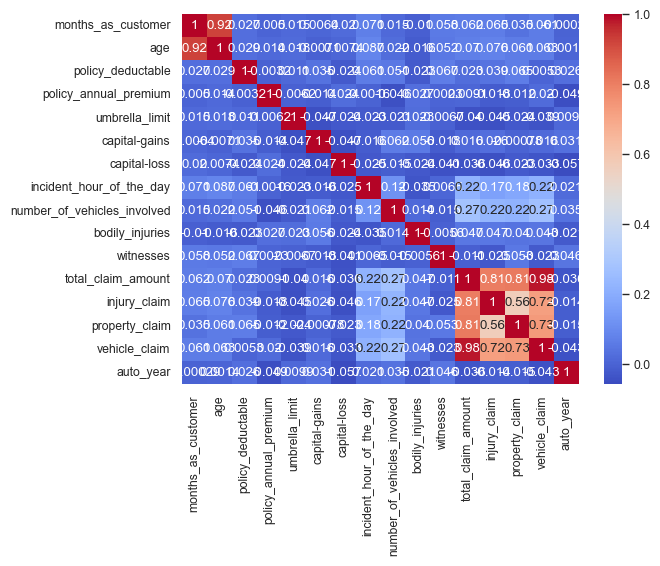

In [66]:
corrmat = df.corr()
sns.heatmap(corrmat,annot = True, cmap = 'coolwarm' )

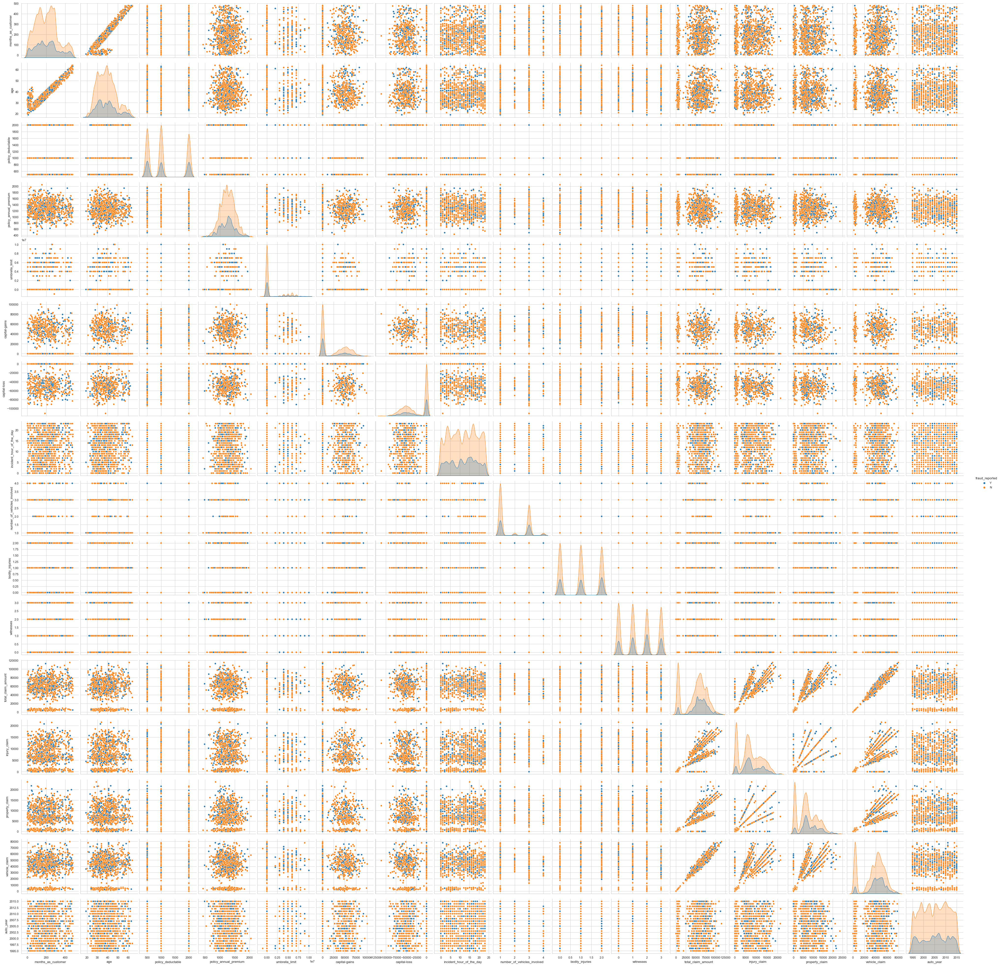

In [68]:
# sns.pairplot(df, hue = 'fraud_reported', diag_kws={'bw': 0.1})

## Convert categorical to numerical

In [72]:

# convert policy csl to numerical
df[['policy_csl_min', 'policy_csl_max']] = df['policy_csl'].str.split('/', expand=True)

# Convert the min_value and max_value columns to numerical format
df['policy_csl_min'] = pd.to_numeric(df['policy_csl_min'])
df['policy_csl_max'] = pd.to_numeric(df['policy_csl_max'])

In [74]:
df.head()

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_csl_min,policy_csl_max
0,328,48,250/500,1000,1406.9100,0,MALE,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y,250,500
1,228,42,250/500,2000,1197.2200,5000000,MALE,other-relative,0,0,Vehicle Theft,?,Minor Damage,8,1,?,0,0,NO,5070,780,780,3510,Mercedes,2007,Y,250,500
2,134,29,100/300,2000,1413.1400,5000000,FEMALE,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N,100,300
3,256,41,250/500,2000,1415.7400,6000000,FEMALE,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y,250,500
4,228,44,500/1000,1000,1583.9100,6000000,MALE,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N,500,1000


In [79]:
df = df.drop('policy_csl',axis=1)

In [82]:
cat_cols = ['insured_sex','insured_relationship']
df = pd.get_dummies(df,columns = cat_cols)

In [83]:
df

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,collision_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_csl_min,policy_csl_max,insured_sex_FEMALE,insured_sex_MALE,insured_relationship_husband,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife
0,328,48,1000,1406.9100,0,53300,0,Single Vehicle Collision,Side Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y,250,500,0,1,1,0,0,0,0,0
1,228,42,2000,1197.2200,5000000,0,0,Vehicle Theft,?,Minor Damage,8,1,?,0,0,NO,5070,780,780,3510,Mercedes,2007,Y,250,500,0,1,0,0,1,0,0,0
2,134,29,2000,1413.1400,5000000,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N,100,300,1,0,0,0,0,1,0,0
3,256,41,2000,1415.7400,6000000,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y,250,500,1,0,0,0,0,0,1,0
4,228,44,1000,1583.9100,6000000,66000,-46000,Vehicle Theft,?,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N,500,1000,0,1,0,0,0,0,1,0
5,256,39,1000,1351.1000,0,0,0,Multi-vehicle Collision,Rear Collision,Major Damage,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,2003,Y,250,500,1,0,0,0,0,0,1,0
6,137,34,1000,1333.3500,0,0,-77000,Multi-vehicle Collision,Front Collision,Minor Damage,0,3,?,0,0,NO,78650,21450,7150,50050,Nissan,2012,N,250,500,0,1,1,0,0,0,0,0
7,165,37,1000,1137.0300,0,0,0,Multi-vehicle Collision,Front Collision,Total Loss,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,2015,N,100,300,0,1,0,0,0,0,1,0
8,27,33,500,1442.9900,0,0,0,Single Vehicle Collision,Front Collision,Total Loss,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,2012,N,100,300,1,0,0,0,0,1,0,0
9,212,42,500,1315.6800,0,0,-39300,Single Vehicle Collision,Rear Collision,Total Loss,14,1,NO,2,1,NO,42300,4700,4700,32900,Saab,1996,N,100,300,0,1,0,0,0,0,0,1


In [86]:
df.collision_type.value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [87]:
cat_cols = ['collision_type']
df = pd.get_dummies(df,columns = cat_cols)

In [92]:
# df = df.drop('collision_type_?',axis=1)
df

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,incident_severity,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_csl_min,policy_csl_max,insured_sex_FEMALE,insured_sex_MALE,insured_relationship_husband,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision
0,328,48,1000,1406.9100,0,53300,0,Single Vehicle Collision,Major Damage,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,2004,Y,250,500,0,1,1,0,0,0,0,0,0,0,1
1,228,42,2000,1197.2200,5000000,0,0,Vehicle Theft,Minor Damage,8,1,?,0,0,NO,5070,780,780,3510,Mercedes,2007,Y,250,500,0,1,0,0,1,0,0,0,0,0,0
2,134,29,2000,1413.1400,5000000,35100,0,Multi-vehicle Collision,Minor Damage,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,2007,N,100,300,1,0,0,0,0,1,0,0,0,1,0
3,256,41,2000,1415.7400,6000000,48900,-62400,Single Vehicle Collision,Major Damage,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y,250,500,1,0,0,0,0,0,1,0,1,0,0
4,228,44,1000,1583.9100,6000000,66000,-46000,Vehicle Theft,Minor Damage,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,2009,N,500,1000,0,1,0,0,0,0,1,0,0,0,0
5,256,39,1000,1351.1000,0,0,0,Multi-vehicle Collision,Major Damage,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,2003,Y,250,500,1,0,0,0,0,0,1,0,0,1,0
6,137,34,1000,1333.3500,0,0,-77000,Multi-vehicle Collision,Minor Damage,0,3,?,0,0,NO,78650,21450,7150,50050,Nissan,2012,N,250,500,0,1,1,0,0,0,0,0,1,0,0
7,165,37,1000,1137.0300,0,0,0,Multi-vehicle Collision,Total Loss,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,2015,N,100,300,0,1,0,0,0,0,1,0,1,0,0
8,27,33,500,1442.9900,0,0,0,Single Vehicle Collision,Total Loss,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,2012,N,100,300,1,0,0,0,0,1,0,0,1,0,0
9,212,42,500,1315.6800,0,0,-39300,Single Vehicle Collision,Total Loss,14,1,NO,2,1,NO,42300,4700,4700,32900,Saab,1996,N,100,300,0,1,0,0,0,0,0,1,0,1,0


In [93]:
cat_cols = ['incident_severity']
df = pd.get_dummies(df,columns = cat_cols)

In [99]:
df[df['fraud_reported'] == 'Y'].property_damage.value_counts() 

?      103
YES     78
NO      66
Name: property_damage, dtype: int64

In [96]:
df.property_damage.value_counts() 

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [100]:
# i decided to drop the missing values when i convert it to numerical, since the difference between them is few

cat_cols = ['property_damage']
df = pd.get_dummies(df,columns = cat_cols)

In [102]:
df = df.drop('property_damage_?',axis = 1)

In [104]:
cat_cols = ['incident_type','police_report_available']
df = pd.get_dummies(df,columns = cat_cols)

In [109]:
# its better to do this one by one, in case we need to drop a column
# use .value_counts() to check the unique values before converting

cat_cols = ['auto_make','auto_year']
df = pd.get_dummies(df,columns = cat_cols)

In [119]:
# drop excess columns

to_drop = ['insured_sex_MALE','property_damage_NO','police_report_available_NO']
df.drop(to_drop, axis = 1, inplace = True)

In [120]:
df

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,policy_csl_min,policy_csl_max,insured_sex_FEMALE,insured_relationship_husband,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Major Damage,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,property_damage_YES,incident_type_Multi-vehicle Collision,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,police_report_available_YES,auto_make_Accura,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen,auto_year_1995,auto_year_1996,auto_year_1997,auto_year_1998,auto_year_1999,auto_year_2000,auto_year_2001,auto_year_2002,auto_year_2003,auto_year_2004,auto_year_2005,auto_year_2006,auto_year_2007,auto_year_2008,auto_year_2009,auto_year_2010,auto_year_2011,auto_year_2012,auto_year_2013,auto_year_2014,auto_year_2015
0,328,48,1000,1406.9100,0,53300,0,5,1,1,2,71610,6510,13020,52080,Y,250,500,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,228,42,2000,1197.2200,5000000,0,0,8,1,0,0,5070,780,780,3510,Y,250,500,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,134,29,2000,1413.1400,5000000,35100,0,7,3,2,3,34650,7700,3850,23100,N,100,300,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,256,41,2000,1415.7400,6000000,48900,-62400,5,1,1,2,63400,6340,6340,50720,Y,250,500,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,228,44,1000,1583.9100,6000000,66000,-46000,20,1,0,1,6500,1300,650,4550,N,500,1000,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
5,256,39,1000,1351.1000,0,0,0,19,3,0,2,64100,6410,6410,51280,Y,250,500,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,137,34,1000,1333.3500,0,0,-77000,0,3,0,0,78650,21450,7150,50050,N,250,500,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,165,37,1000,1137.0300,0,0,0,23,3,2,2,51590,9380,9380,32830,N,100,300,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8,27,33,500,1442.9900,0,0,0,21,1,1,1,27700,2770,2770,22160,N,100,300,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9,212,42,500,1315.6800,0,0,-39300,14,1,2,1,42300,4700,4700,32900,N,100,300,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [121]:
df.shape

(1000, 73)

# Build the model!

In [122]:
# separate feature and target variable
x = df.drop(["fraud_reported"],axis=1)
y = df["fraud_reported"]

In [124]:
# split dataset 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=101)

In [125]:
#Check shape to make sure it is all in order
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((750, 72), (250, 72), (750,), (250,))

In [126]:
#Instantiate the Scaler
scaler = MinMaxScaler()

#Fit and Transform to the Train Set
x_train_scaled = scaler.fit_transform(x_train)

#Transform the Test Set
x_test_scaled = scaler.transform(x_test)

# Traine the model

In [130]:
#Instantiate the Algorithm 
logreg = LogisticRegression(C=1.0, class_weight="balanced", solver='liblinear', random_state=25)

#Train/Fit the model
logreg.fit(x_train_scaled, y_train)

LogisticRegression(class_weight='balanced', random_state=25, solver='liblinear')

In [131]:
#Create a DataFrame for easy understanding the coeffiecient 

coef = pd.DataFrame(x_train.columns, columns=["Features"])

coef['Coef'] = logreg.coef_.reshape(-1,1)

#Optional: Sort Descending (highest value first) 
coef_sorted = coef.sort_values("Coef", ascending=False)

coef_sorted.head(10)

,Features,Coef
27,incident_severity_Major Damage,2.0803
4,umbrella_limit,1.0399
60,auto_year_2004,0.6768
61,auto_year_2005,0.4703
14,vehicle_claim,0.4333
52,auto_year_1996,0.4212
50,auto_make_Volkswagen,0.4194
62,auto_year_2006,0.3751
39,auto_make_BMW,0.3714
51,auto_year_1995,0.3588


In [132]:
#Make Predictions
y_pred = logreg.predict(x_test_scaled)

In [133]:
#Predict probabilities
y_prob = logreg.predict_proba(x_test_scaled)
y_prob

array([[0.33093922, 0.66906078],
       [0.85760729, 0.14239271],
       [0.25927972, 0.74072028],
       [0.81123307, 0.18876693],
       [0.49924249, 0.50075751],
       [0.53305381, 0.46694619],
       [0.72702436, 0.27297564],
       [0.81145045, 0.18854955],
       [0.51592979, 0.48407021],
       [0.9049336 , 0.0950664 ],
       [0.72186886, 0.27813114],
       [0.09569907, 0.90430093],
       [0.17983334, 0.82016666],
       [0.5395678 , 0.4604322 ],
       [0.47075277, 0.52924723],
       [0.2161975 , 0.7838025 ],
       [0.14555158, 0.85444842],
       [0.11782881, 0.88217119],
       [0.61517073, 0.38482927],
       [0.64883432, 0.35116568],
       [0.88748701, 0.11251299],
       [0.32171372, 0.67828628],
       [0.94518872, 0.05481128],
       [0.87030857, 0.12969143],
       [0.14402143, 0.85597857],
       [0.8326198 , 0.1673802 ],
       [0.50234043, 0.49765957],
       [0.09186413, 0.90813587],
       [0.63469615, 0.36530385],
       [0.64428459, 0.35571541],
       [0.

In [ ]:
#Create a DataFrame
y_prob_df = pd.DataFrame(y_prob, index=x_test.index)

In [137]:
#Put all information on a DataFrame for analysis

#Copy original test data
df_results = x_test.copy()

#Add actual, predicted, and predicted probability results

df_results["Predicted_Prob_0"] = y_prob_df[0]
df_results["Predicted_Prob_1"] = y_prob_df[1]
df_results["Actual_Class"] = y_test
df_results["Predicted_Class"] = y_pred

labels = logreg.classes_

In [139]:
df_results.head(10)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_csl_min,policy_csl_max,insured_sex_FEMALE,insured_relationship_husband,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Major Damage,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,property_damage_YES,incident_type_Multi-vehicle Collision,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,police_report_available_YES,auto_make_Accura,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen,auto_year_1995,auto_year_1996,auto_year_1997,auto_year_1998,auto_year_1999,auto_year_2000,auto_year_2001,auto_year_2002,auto_year_2003,auto_year_2004,auto_year_2005,auto_year_2006,auto_year_2007,auto_year_2008,auto_year_2009,auto_year_2010,auto_year_2011,auto_year_2012,auto_year_2013,auto_year_2014,auto_year_2015,Predicted_Prob_0,Predicted_Prob_1,Actual_Class,Predicted_Class
545,131,29,1000,978.2700,0,65700,0,5,1,1,3,76400,15280,7640,53480,250,500,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.3309,0.6691,N,Y
298,194,35,500,1416.2400,0,0,0,7,1,1,0,5940,1080,540,4320,500,1000,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.8576,0.1424,N,N
109,87,31,1000,1074.0700,0,0,-47500,16,3,0,3,60940,5540,11080,44320,500,1000,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.2593,0.7407,Y,Y
837,9,24,2000,1304.4600,0,51700,-33300,6,1,0,3,5940,540,1080,4320,100,300,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.8112,0.1888,Y,N
194,73,26,2000,1191.1900,4000000,29300,0,9,3,0,1,40160,5020,0,35140,250,500,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.4992,0.5008,N,Y
605,246,44,1000,1397.0000,0,0,0,6,1,1,0,61740,6860,6860,48020,100,300,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.5331,0.4669,N,N
246,2,28,1000,1340.5600,0,0,0,19,1,0,2,58140,6460,6460,45220,250,500,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.7270,0.2730,N,N
693,134,36,1000,1497.4100,0,14100,-44500,17,3,2,0,77200,9650,9650,57900,250,500,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.8115,0.1885,N,N
802,200,34,1000,828.4200,3000000,0,0,10,1,2,2,56000,5600,5600,44800,250,500,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.5159,0.4841,N,N
406,280,41,2000,1140.3100,0,29300,-64700,10,3,0,3,53020,9640,9640,33740,500,1000,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.9049,0.0951,N,N


# Classification Metrix

In [142]:
#Classification Metrics
from sklearn import metrics

In [143]:
#Get the Confusion Matrix
cm = metrics.confusion_matrix(y_test, y_pred, labels=labels)

#Put in DataFrame
cm_df = pd.DataFrame(cm, index=labels, columns=labels)
cm_df

,N,Y
N,162,41
Y,17,30


Text(0.5, 25.916666666666657, 'Predicted label')

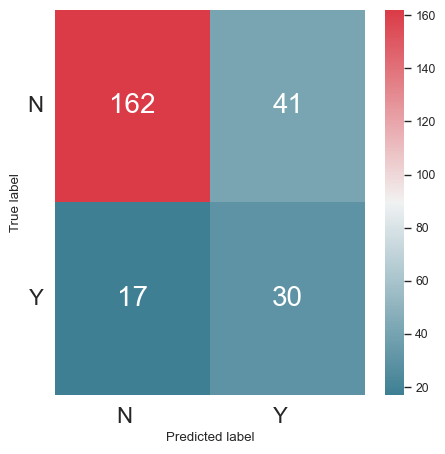

In [144]:
#Plot Attributes
fig = plt.figure(figsize= (5,5))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

#Seaborn Heatmap - PASS YOUR CONFUSION MATRIX DATAFRAME HERE
heatmap = sns.heatmap(cm_df,annot=True,annot_kws={"size": 20}, fmt="d", cmap=cmap)

#Heatmap attributes
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=16)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=16)
plt.ylabel('True label')
plt.xlabel('Predicted label')

### Accuracy

In [145]:
#Accuracy Rate
accuracy = metrics.accuracy_score(y_test,y_pred)

#Print accuracy 
print("Accuracy Rate: %.2f" % (accuracy * 100))

Accuracy Rate: 76.80


In [147]:
#Error Rate
error = 1 - accuracy

#Print Error
print("Error Rate: %.2f" % (error * 100))

Error Rate: 23.20


### precision Metrix

In [148]:
precision = metrics.precision_score(y_test,y_pred,labels=labels, average=None)

precision_df = pd.DataFrame(precision, index=labels, columns=['Precision'])

precision_df

,Precision
N,0.9050
Y,0.4225


In [149]:
recall = metrics.recall_score(y_test,y_pred,labels=labels, average=None)

recall_df = pd.DataFrame(recall, index=labels, columns=['Recall'])

recall_df

,Recall
N,0.7980
Y,0.6383


In [150]:
f1 = metrics.f1_score(y_test,y_pred,labels=labels, average=None)

f1_df = pd.DataFrame(f1, index=labels, columns=['F1'])

f1_df

,F1
N,0.8482
Y,0.5085


In [151]:
classification_report = metrics.classification_report(y_test,y_pred)

print(classification_report)

              precision    recall  f1-score   support

           N       0.91      0.80      0.85       203
           Y       0.42      0.64      0.51        47

    accuracy                           0.77       250
   macro avg       0.66      0.72      0.68       250
weighted avg       0.81      0.77      0.78       250



In [154]:
#Predict the Probabilities
predict_proba_1 = df_results["Predicted_Prob_1"]

#Calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test, predict_proba_1, pos_label='Y')

#Calculate the AUC
roc_auc = metrics.roc_auc_score(y_test,predict_proba_1)

print("AUC: %.2f" % (roc_auc))

AUC: 0.74


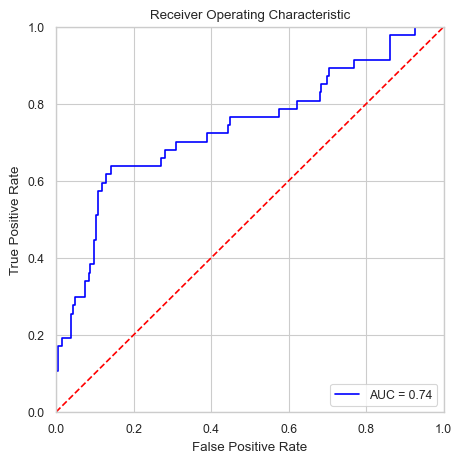

In [155]:
#Plot the AUC-ROC Curve
#Plot Attributes
fig = plt.figure(figsize= (5,5))

#Plot Title
plt.title('Receiver Operating Characteristic')

#Plot Function
plt.plot(fpr, tpr, 'b', label = 'AUC = %.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()